In [1]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt # for making figures
%matplotlib inline

In [2]:
# read in all the words
words = open('names.txt', 'r').read().splitlines()
words[:8]

['emma', 'olivia', 'ava', 'isabella', 'sophia', 'charlotte', 'mia', 'amelia']

In [3]:
len(words)

32033

In [4]:
# build the vocabulary of characters and mappings to/from integers
chars = sorted(list(set(''.join(words))))
stoi = {s:i+1 for i,s in enumerate(chars)}
stoi['.'] = 0
itos = {i:s for s,i in stoi.items()}
print(itos)

{1: 'a', 2: 'b', 3: 'c', 4: 'd', 5: 'e', 6: 'f', 7: 'g', 8: 'h', 9: 'i', 10: 'j', 11: 'k', 12: 'l', 13: 'm', 14: 'n', 15: 'o', 16: 'p', 17: 'q', 18: 'r', 19: 's', 20: 't', 21: 'u', 22: 'v', 23: 'w', 24: 'x', 25: 'y', 26: 'z', 0: '.'}


In [6]:
# build the dataset

block_size = 3 # context length: how many characters do we take to predict the next one?
X, Y = [], []
for w in words:
  
  #print(w)
  context = [0] * block_size
  for ch in w + '.':
    ix = stoi[ch]
    X.append(context)
    Y.append(ix)
    print(''.join(itos[i] for i in context), '--->', itos[ix])
    context = context[1:] + [ix] # crop and append
  
X = torch.tensor(X)
Y = torch.tensor(Y)

... ---> e
..e ---> m
.em ---> m
emm ---> a
mma ---> .
... ---> o
..o ---> l
.ol ---> i
oli ---> v
liv ---> i
ivi ---> a
via ---> .
... ---> a
..a ---> v
.av ---> a
ava ---> .
... ---> i
..i ---> s
.is ---> a
isa ---> b
sab ---> e
abe ---> l
bel ---> l
ell ---> a
lla ---> .
... ---> s
..s ---> o
.so ---> p
sop ---> h
oph ---> i
phi ---> a
hia ---> .
... ---> c
..c ---> h
.ch ---> a
cha ---> r
har ---> l
arl ---> o
rlo ---> t
lot ---> t
ott ---> e
tte ---> .
... ---> m
..m ---> i
.mi ---> a
mia ---> .
... ---> a
..a ---> m
.am ---> e
ame ---> l
mel ---> i
eli ---> a
lia ---> .
... ---> h
..h ---> a
.ha ---> r
har ---> p
arp ---> e
rpe ---> r
per ---> .
... ---> e
..e ---> v
.ev ---> e
eve ---> l
vel ---> y
ely ---> n
lyn ---> .
... ---> a
..a ---> b
.ab ---> i
abi ---> g
big ---> a
iga ---> i
gai ---> l
ail ---> .
... ---> e
..e ---> m
.em ---> i
emi ---> l
mil ---> y
ily ---> .
... ---> e
..e ---> l
.el ---> i
eli ---> z
liz ---> a
iza ---> b
zab ---> e
abe ---> t
bet ---> h
eth ---> .

In [7]:
# build the dataset

block_size = 4 # context length: how many characters do we take to predict the next one?
X, Y = [], []
for w in words:
  
  #print(w)
  context = [0] * block_size
  for ch in w + '.':
    ix = stoi[ch]
    X.append(context)
    Y.append(ix)
    print(''.join(itos[i] for i in context), '--->', itos[ix])
    context = context[1:] + [ix] # crop and append
  
X = torch.tensor(X)
Y = torch.tensor(Y)

.... ---> e
...e ---> m
..em ---> m
.emm ---> a
emma ---> .
.... ---> o
...o ---> l
..ol ---> i
.oli ---> v
oliv ---> i
livi ---> a
ivia ---> .
.... ---> a
...a ---> v
..av ---> a
.ava ---> .
.... ---> i
...i ---> s
..is ---> a
.isa ---> b
isab ---> e
sabe ---> l
abel ---> l
bell ---> a
ella ---> .
.... ---> s
...s ---> o
..so ---> p
.sop ---> h
soph ---> i
ophi ---> a
phia ---> .
.... ---> c
...c ---> h
..ch ---> a
.cha ---> r
char ---> l
harl ---> o
arlo ---> t
rlot ---> t
lott ---> e
otte ---> .
.... ---> m
...m ---> i
..mi ---> a
.mia ---> .
.... ---> a
...a ---> m
..am ---> e
.ame ---> l
amel ---> i
meli ---> a
elia ---> .
.... ---> h
...h ---> a
..ha ---> r
.har ---> p
harp ---> e
arpe ---> r
rper ---> .
.... ---> e
...e ---> v
..ev ---> e
.eve ---> l
evel ---> y
vely ---> n
elyn ---> .
.... ---> a
...a ---> b
..ab ---> i
.abi ---> g
abig ---> a
biga ---> i
igai ---> l
gail ---> .
.... ---> e
...e ---> m
..em ---> i
.emi ---> l
emil ---> y
mily ---> .
.... ---> e
...e ---> l
..el

In [28]:
# build the dataset

block_size = 3 # context length: how many characters do we take to predict the next one?
X, Y = [], []
for w in words[:5]:
  
  #print(w)
  context = [0] * block_size
  for ch in w + '.':
    ix = stoi[ch]
    X.append(context)
    Y.append(ix)
    print(''.join(itos[i] for i in context), '--->', itos[ix])
    context = context[1:] + [ix] # crop and append
  
X = torch.tensor(X)
Y = torch.tensor(Y)

... ---> e
..e ---> m
.em ---> m
emm ---> a
mma ---> .
... ---> o
..o ---> l
.ol ---> i
oli ---> v
liv ---> i
ivi ---> a
via ---> .
... ---> a
..a ---> v
.av ---> a
ava ---> .
... ---> i
..i ---> s
.is ---> a
isa ---> b
sab ---> e
abe ---> l
bel ---> l
ell ---> a
lla ---> .
... ---> s
..s ---> o
.so ---> p
sop ---> h
oph ---> i
phi ---> a
hia ---> .


In [29]:
X.shape, X.dtype, Y.shape, Y.dtype

(torch.Size([32, 3]), torch.int64, torch.Size([32]), torch.int64)

In [30]:
X

tensor([[ 0,  0,  0],
        [ 0,  0,  5],
        [ 0,  5, 13],
        [ 5, 13, 13],
        [13, 13,  1],
        [ 0,  0,  0],
        [ 0,  0, 15],
        [ 0, 15, 12],
        [15, 12,  9],
        [12,  9, 22],
        [ 9, 22,  9],
        [22,  9,  1],
        [ 0,  0,  0],
        [ 0,  0,  1],
        [ 0,  1, 22],
        [ 1, 22,  1],
        [ 0,  0,  0],
        [ 0,  0,  9],
        [ 0,  9, 19],
        [ 9, 19,  1],
        [19,  1,  2],
        [ 1,  2,  5],
        [ 2,  5, 12],
        [ 5, 12, 12],
        [12, 12,  1],
        [ 0,  0,  0],
        [ 0,  0, 19],
        [ 0, 19, 15],
        [19, 15, 16],
        [15, 16,  8],
        [16,  8,  9],
        [ 8,  9,  1]])

In [31]:
Y # Labels

tensor([ 5, 13, 13,  1,  0, 15, 12,  9, 22,  9,  1,  0,  1, 22,  1,  0,  9, 19,
         1,  2,  5, 12, 12,  1,  0, 19, 15, 16,  8,  9,  1,  0])

In [32]:
C = torch.randn((27, 2))

In [33]:
C

tensor([[ 0.0329,  0.0300],
        [-0.1401, -1.3399],
        [-0.7785, -1.2945],
        [-0.1382,  0.0513],
        [ 1.1033,  1.0541],
        [-1.6517,  0.8283],
        [ 1.2030,  0.5138],
        [-0.1447, -0.1646],
        [-1.0140,  0.3872],
        [-0.0684, -0.5458],
        [ 0.4517, -0.2586],
        [ 0.3272,  2.3422],
        [-0.4553, -1.2018],
        [-0.1977,  0.2685],
        [ 0.3247, -0.1024],
        [ 1.3631,  0.5929],
        [ 1.0068,  0.1844],
        [-1.1798,  0.6677],
        [-0.1576,  0.7530],
        [-1.3397,  1.2450],
        [ 0.8265,  1.4497],
        [-1.9146, -1.0581],
        [-0.1114, -0.4381],
        [-1.0294, -0.1145],
        [ 0.3387, -1.1683],
        [-0.4158, -0.7334],
        [-0.7233,  3.4746]])

In [34]:
C[5]

tensor([-1.6517,  0.8283])

In [35]:
F.one_hot(torch.tensor(5), num_classes=27)

tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0])

In [36]:
F.one_hot(torch.tensor(5), num_classes=27).shape

torch.Size([27])

In [37]:
F.one_hot(torch.tensor(5), num_classes=27).dtype

torch.int64

In [38]:
F.one_hot(torch.tensor(5), num_classes=27).float() @ C

tensor([-1.6517,  0.8283])

In [39]:
C[[5, 6, 7]]

tensor([[-1.6517,  0.8283],
        [ 1.2030,  0.5138],
        [-0.1447, -0.1646]])

In [40]:
C[torch.tensor([5, 6, 7, 7, 7, 7, 7,7 ])]

tensor([[-1.6517,  0.8283],
        [ 1.2030,  0.5138],
        [-0.1447, -0.1646],
        [-0.1447, -0.1646],
        [-0.1447, -0.1646],
        [-0.1447, -0.1646],
        [-0.1447, -0.1646],
        [-0.1447, -0.1646]])

In [41]:
C[X]

tensor([[[ 0.0329,  0.0300],
         [ 0.0329,  0.0300],
         [ 0.0329,  0.0300]],

        [[ 0.0329,  0.0300],
         [ 0.0329,  0.0300],
         [-1.6517,  0.8283]],

        [[ 0.0329,  0.0300],
         [-1.6517,  0.8283],
         [-0.1977,  0.2685]],

        [[-1.6517,  0.8283],
         [-0.1977,  0.2685],
         [-0.1977,  0.2685]],

        [[-0.1977,  0.2685],
         [-0.1977,  0.2685],
         [-0.1401, -1.3399]],

        [[ 0.0329,  0.0300],
         [ 0.0329,  0.0300],
         [ 0.0329,  0.0300]],

        [[ 0.0329,  0.0300],
         [ 0.0329,  0.0300],
         [ 1.3631,  0.5929]],

        [[ 0.0329,  0.0300],
         [ 1.3631,  0.5929],
         [-0.4553, -1.2018]],

        [[ 1.3631,  0.5929],
         [-0.4553, -1.2018],
         [-0.0684, -0.5458]],

        [[-0.4553, -1.2018],
         [-0.0684, -0.5458],
         [-0.1114, -0.4381]],

        [[-0.0684, -0.5458],
         [-0.1114, -0.4381],
         [-0.0684, -0.5458]],

        [[-0.1114, -0

In [42]:
C[X].shape

torch.Size([32, 3, 2])

In [44]:
X[13][2]

tensor(1)

In [45]:
C[X][13, 2]

tensor([-0.1401, -1.3399])

In [46]:
C[1]

tensor([-0.1401, -1.3399])

In [48]:
emb = C[X]
emb.shape

torch.Size([32, 3, 2])

In [49]:
emb[:, 0, :].shape # emb[:, 1, :], emb[:, 2, :]

torch.Size([32, 2])

In [50]:
torch.cat([emb[:, 0, :], emb[:, 1, :], emb[:, 2, :]], 1)

tensor([[ 0.0329,  0.0300,  0.0329,  0.0300,  0.0329,  0.0300],
        [ 0.0329,  0.0300,  0.0329,  0.0300, -1.6517,  0.8283],
        [ 0.0329,  0.0300, -1.6517,  0.8283, -0.1977,  0.2685],
        [-1.6517,  0.8283, -0.1977,  0.2685, -0.1977,  0.2685],
        [-0.1977,  0.2685, -0.1977,  0.2685, -0.1401, -1.3399],
        [ 0.0329,  0.0300,  0.0329,  0.0300,  0.0329,  0.0300],
        [ 0.0329,  0.0300,  0.0329,  0.0300,  1.3631,  0.5929],
        [ 0.0329,  0.0300,  1.3631,  0.5929, -0.4553, -1.2018],
        [ 1.3631,  0.5929, -0.4553, -1.2018, -0.0684, -0.5458],
        [-0.4553, -1.2018, -0.0684, -0.5458, -0.1114, -0.4381],
        [-0.0684, -0.5458, -0.1114, -0.4381, -0.0684, -0.5458],
        [-0.1114, -0.4381, -0.0684, -0.5458, -0.1401, -1.3399],
        [ 0.0329,  0.0300,  0.0329,  0.0300,  0.0329,  0.0300],
        [ 0.0329,  0.0300,  0.0329,  0.0300, -0.1401, -1.3399],
        [ 0.0329,  0.0300, -0.1401, -1.3399, -0.1114, -0.4381],
        [-0.1401, -1.3399, -0.1114, -0.4

In [51]:
torch.cat([emb[:, 0, :], emb[:, 1, :], emb[:, 2, :]], 1).shape

torch.Size([32, 6])

In [55]:
len(torch.unbind(emb, 1))

3

In [56]:
torch.cat(torch.unbind(emb, 1), 1)

tensor([[ 0.0329,  0.0300,  0.0329,  0.0300,  0.0329,  0.0300],
        [ 0.0329,  0.0300,  0.0329,  0.0300, -1.6517,  0.8283],
        [ 0.0329,  0.0300, -1.6517,  0.8283, -0.1977,  0.2685],
        [-1.6517,  0.8283, -0.1977,  0.2685, -0.1977,  0.2685],
        [-0.1977,  0.2685, -0.1977,  0.2685, -0.1401, -1.3399],
        [ 0.0329,  0.0300,  0.0329,  0.0300,  0.0329,  0.0300],
        [ 0.0329,  0.0300,  0.0329,  0.0300,  1.3631,  0.5929],
        [ 0.0329,  0.0300,  1.3631,  0.5929, -0.4553, -1.2018],
        [ 1.3631,  0.5929, -0.4553, -1.2018, -0.0684, -0.5458],
        [-0.4553, -1.2018, -0.0684, -0.5458, -0.1114, -0.4381],
        [-0.0684, -0.5458, -0.1114, -0.4381, -0.0684, -0.5458],
        [-0.1114, -0.4381, -0.0684, -0.5458, -0.1401, -1.3399],
        [ 0.0329,  0.0300,  0.0329,  0.0300,  0.0329,  0.0300],
        [ 0.0329,  0.0300,  0.0329,  0.0300, -0.1401, -1.3399],
        [ 0.0329,  0.0300, -0.1401, -1.3399, -0.1114, -0.4381],
        [-0.1401, -1.3399, -0.1114, -0.4

In [57]:
torch.cat(torch.unbind(emb, 1), 1).shape

torch.Size([32, 6])

In [58]:
a = torch.arange(18)
a

tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17])

In [59]:
a.shape

torch.Size([18])

In [60]:
a.view(2, 9)

tensor([[ 0,  1,  2,  3,  4,  5,  6,  7,  8],
        [ 9, 10, 11, 12, 13, 14, 15, 16, 17]])

In [61]:
a.view(9, 2)

tensor([[ 0,  1],
        [ 2,  3],
        [ 4,  5],
        [ 6,  7],
        [ 8,  9],
        [10, 11],
        [12, 13],
        [14, 15],
        [16, 17]])

In [62]:
a.view(3, 3, 2)

tensor([[[ 0,  1],
         [ 2,  3],
         [ 4,  5]],

        [[ 6,  7],
         [ 8,  9],
         [10, 11]],

        [[12, 13],
         [14, 15],
         [16, 17]]])

In [63]:
a.storage()

C:\Users\vidya.bhandary\AppData\Local\Temp\ipykernel_34720\214256462.py:1: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  a.storage()


 0
 1
 2
 3
 4
 5
 6
 7
 8
 9
 10
 11
 12
 13
 14
 15
 16
 17
[torch.storage.TypedStorage(dtype=torch.int64, device=cpu) of size 18]

In [64]:
emb.shape

torch.Size([32, 3, 2])

In [65]:
emb.view(32, 6)

tensor([[ 0.0329,  0.0300,  0.0329,  0.0300,  0.0329,  0.0300],
        [ 0.0329,  0.0300,  0.0329,  0.0300, -1.6517,  0.8283],
        [ 0.0329,  0.0300, -1.6517,  0.8283, -0.1977,  0.2685],
        [-1.6517,  0.8283, -0.1977,  0.2685, -0.1977,  0.2685],
        [-0.1977,  0.2685, -0.1977,  0.2685, -0.1401, -1.3399],
        [ 0.0329,  0.0300,  0.0329,  0.0300,  0.0329,  0.0300],
        [ 0.0329,  0.0300,  0.0329,  0.0300,  1.3631,  0.5929],
        [ 0.0329,  0.0300,  1.3631,  0.5929, -0.4553, -1.2018],
        [ 1.3631,  0.5929, -0.4553, -1.2018, -0.0684, -0.5458],
        [-0.4553, -1.2018, -0.0684, -0.5458, -0.1114, -0.4381],
        [-0.0684, -0.5458, -0.1114, -0.4381, -0.0684, -0.5458],
        [-0.1114, -0.4381, -0.0684, -0.5458, -0.1401, -1.3399],
        [ 0.0329,  0.0300,  0.0329,  0.0300,  0.0329,  0.0300],
        [ 0.0329,  0.0300,  0.0329,  0.0300, -0.1401, -1.3399],
        [ 0.0329,  0.0300, -0.1401, -1.3399, -0.1114, -0.4381],
        [-0.1401, -1.3399, -0.1114, -0.4

In [66]:
emb.view(32, 6) == torch.cat(torch.unbind(emb, 1), 1)

tensor([[True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, True, True],
        [True, True, True, True, T

In [67]:
W1 = torch.randn((6, 100))
b1 = torch.randn(100)

In [69]:
h = emb.view(32, 6) @ W1 + b1

In [70]:
h.shape

torch.Size([32, 100])

In [71]:
h

tensor([[ 1.1169, -0.3802,  0.8744,  ...,  0.1572,  0.2252, -1.6255],
        [ 2.3786, -1.6531, -1.1526,  ...,  0.9263,  0.5730,  0.5170],
        [-0.5908, -2.0487,  2.8655,  ..., -4.4780,  1.3416,  1.5710],
        ...,
        [ 3.0203, -1.6431, -2.5942,  ...,  4.4521,  0.8507, -2.2437],
        [ 0.9801, -1.3568,  0.8338,  ..., -1.2389,  0.0826, -0.4480],
        [ 0.5465,  3.0288,  0.9849,  ...,  1.4758, -1.6829, -3.7730]])

In [72]:
h = emb.view(-1, 6) @ W1 + b1 # Note the usage of -1 to infer the size

In [73]:
h.shape

torch.Size([32, 100])

In [74]:
h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # Note the usage of -1 to infer the size

In [77]:
h # These are now numbers between -1 and 1 bcoz of the tanh

tensor([[ 0.8065, -0.3629,  0.7036,  ...,  0.1560,  0.2214, -0.9254],
        [ 0.9830, -0.9293, -0.8186,  ...,  0.7289,  0.5176,  0.4754],
        [-0.5305, -0.9673,  0.9935,  ..., -0.9997,  0.8721,  0.9172],
        ...,
        [ 0.9953, -0.9279, -0.9889,  ...,  0.9997,  0.6915, -0.9777],
        [ 0.7531, -0.8756,  0.6825,  ..., -0.8451,  0.0824, -0.4203],
        [ 0.4979,  0.9953,  0.7552,  ...,  0.9007, -0.9332, -0.9989]])

In [78]:
h.shape

torch.Size([32, 100])

In [79]:
(emb.view(-1, 6) @ W1).shape

torch.Size([32, 100])

In [80]:
b1.shape

torch.Size([100])

In [81]:
W2 = torch.randn((100, 27))
b2 = torch.randn(27)

In [82]:
logits = h @ W2 + b2

In [83]:
logits.shape

torch.Size([32, 27])

In [84]:
logits[:1]

tensor([[ 2.6935,  7.4595, 10.4699, -9.7844, -3.7624,  2.5287,  2.6812, -0.7707,
         -2.9764, 12.7990,  1.1262,  2.2820,  1.7306, -1.0291, -7.5680, -2.3286,
          2.3428,  5.5713, -3.2184, -0.7378,  2.9340,  6.9037,  2.0839, -5.8970,
         -5.2062, -5.1125, -4.5155]])

In [85]:
counts = logits.exp()

In [87]:
prob = counts / counts.sum(1, keepdims = True)

In [88]:
prob.shape

torch.Size([32, 27])

In [89]:
prob[:1]

tensor([[3.6942e-05, 4.3385e-03, 8.8054e-02, 1.4074e-10, 5.8042e-08, 3.1327e-05,
         3.6489e-05, 1.1562e-06, 1.2738e-07, 9.0421e-01, 7.7063e-06, 2.4479e-05,
         1.4104e-05, 8.9288e-07, 1.2912e-09, 2.4346e-07, 2.6014e-05, 6.5665e-04,
         9.9995e-08, 1.1949e-06, 4.6981e-05, 2.4888e-03, 2.0079e-05, 6.8656e-09,
         1.3699e-08, 1.5045e-08, 2.7331e-08]])

In [90]:
prob[:1].sum()

tensor(1.)

In [91]:
prob[0].sum()

tensor(1.)

In [93]:
prob[torch.arange(32), Y]

tensor([3.1327e-05, 1.4371e-12, 6.9905e-10, 3.1695e-09, 1.8708e-09, 2.4346e-07,
        1.8641e-05, 2.1719e-02, 1.5446e-09, 3.3994e-04, 7.8350e-01, 1.2443e-10,
        4.3385e-03, 1.5404e-04, 2.6875e-03, 1.3565e-10, 9.0421e-01, 6.0927e-07,
        1.0704e-07, 5.9654e-09, 6.7413e-05, 3.5241e-10, 4.8485e-01, 4.4063e-06,
        1.5830e-08, 1.1949e-06, 3.7535e-08, 2.1338e-02, 4.6361e-11, 1.2697e-08,
        4.1664e-06, 2.1510e-10])

In [94]:
loss = -prob[torch.arange(32), Y].log().mean()
loss

tensor(13.9224)

In [95]:
# ------------ now made respectable :) ---------------

In [99]:
g = torch.Generator().manual_seed(2147483647) # for reproducibility
C = torch.randn((27, 2), generator=g)
W1 = torch.randn((6, 100), generator=g)
b1 = torch.randn(100, generator=g)
W2 = torch.randn((100, 27), generator=g)
b2 = torch.randn(27, generator=g)
parameters = [C, W1, b1, W2, b2]

In [100]:
sum(p.nelement() for p in parameters) # number of parameters in total

3481

In [101]:
emb = C[X] # 32, 3, 3
h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # 32, 100
logits = h @ W2 + b2 # 32, 27
counts = logits.exp()
prob = counts / counts.sum(1, keepdims=True)
loss = -prob[torch.arange(32), Y].log().mean()
loss

tensor(17.7697)

In [102]:
F.cross_entropy(logits, Y)

tensor(17.7697)

In [103]:
emb = C[X] # 32, 3, 3
h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # 32, 100
logits = h @ W2 + b2 # 32, 27
# counts = logits.exp()
# prob = counts / counts.sum(1, keepdims=True)
# loss = -prob[torch.arange(32), Y].log().mean()
loss = F.cross_entropy(logits, Y)
loss

tensor(17.7697)

In [106]:
nlogits = torch.tensor([-100, 3, 0, 100]) # cannot pass very large numbers to these logits bcoz it ends up with infinity
ncounts = nlogits.exp()
nprobs = ncounts / ncounts.sum()
nprobs

tensor([0., 0., 0., nan])

In [107]:
ncounts

tensor([3.7835e-44, 2.0086e+01, 1.0000e+00,        inf])

In [108]:
nlogits = torch.tensor([-100, 3, 0, 5]) # cannot pass very large numbers to these logits bcoz it ends up with infinity
ncounts = nlogits.exp()
nprobs = ncounts / ncounts.sum()
nprobs

tensor([0.0000, 0.1185, 0.0059, 0.8756])

In [110]:
nlogits = torch.tensor([-100, 3, 0, 5]) + 3 # The offsetting due to which the probs remain same 
ncounts = nlogits.exp()
nprobs = ncounts / ncounts.sum()
nprobs

tensor([0.0000, 0.1185, 0.0059, 0.8756])

In [111]:
for p in parameters:
    p.requires_grad = True

In [116]:
for _ in range(10):
    # forward pass
    emb = C[X] # 32, 3, 3
    h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # 32, 100
    logits = h @ W2 + b2 # 32, 27
    loss = F.cross_entropy(logits, Y)
    print(loss.item())
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    # update
    for p in parameters:
        p.data += -0.1 * p.grad

0.78919917345047
0.7621746063232422
0.7359814047813416
0.7105579972267151
0.6858610510826111
0.6618654131889343
0.638565719127655
0.6159819960594177
0.5941659808158875
0.573210597038269


In [117]:
for _ in range(1000):
    # forward pass
    emb = C[X] # 32, 3, 3
    h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # 32, 100
    logits = h @ W2 + b2 # 32, 27
    loss = F.cross_entropy(logits, Y)
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    # update
    for p in parameters:
        p.data += -0.1 * p.grad
print(loss.item())        

0.2558909058570862


In [119]:
logits.max(1)

torch.return_types.max(
values=tensor([13.3797, 17.8692, 20.6198, 20.6584, 16.7958, 13.3797, 16.0303, 14.2346,
        15.9621, 18.4532, 16.0037, 20.9876, 13.3797, 17.1903, 17.2115, 20.1299,
        13.3797, 16.5177, 15.2039, 17.1215, 18.6408, 16.0304, 10.9310, 10.7375,
        15.5446, 13.3797, 16.2874, 17.0107, 12.7805, 16.2557, 19.1500, 16.1004],
       grad_fn=<MaxBackward0>),
indices=tensor([ 9, 13, 13,  1,  0,  9, 12,  9, 22,  9,  1,  0,  9, 22,  1,  0,  9, 19,
         1,  2,  5, 12, 12,  1,  0,  9, 15, 16,  8,  9,  1,  0]))

In [120]:
Y

tensor([ 5, 13, 13,  1,  0, 15, 12,  9, 22,  9,  1,  0,  1, 22,  1,  0,  9, 19,
         1,  2,  5, 12, 12,  1,  0, 19, 15, 16,  8,  9,  1,  0])

# Processing the full dataset

In [124]:
# build the dataset

block_size = 3 # context length: how many characters do we take to predict the next one?
X, Y = [], []
for w in words:
  
  #print(w)
  context = [0] * block_size
  for ch in w + '.':
    ix = stoi[ch]
    X.append(context)
    Y.append(ix)
    # print(''.join(itos[i] for i in context), '--->', itos[ix])
    context = context[1:] + [ix] # crop and append
  
X = torch.tensor(X)
Y = torch.tensor(Y)

In [125]:
X.shape, X.dtype, Y.shape, Y.dtype

(torch.Size([228146, 3]), torch.int64, torch.Size([228146]), torch.int64)

In [126]:
g = torch.Generator().manual_seed(2147483647) # for reproducibility
C = torch.randn((27, 2), generator=g)
W1 = torch.randn((6, 100), generator=g)
b1 = torch.randn(100, generator=g)
W2 = torch.randn((100, 27), generator=g)
b2 = torch.randn(27, generator=g)
parameters = [C, W1, b1, W2, b2]

In [127]:
sum(p.nelement() for p in parameters) # number of parameters in total

3481

In [128]:
for p in parameters:
    p.requires_grad = True

In [130]:
for _ in range(10):
    # forward pass
    emb = C[X] # 32, 3, 3
    h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # 32, 100
    logits = h @ W2 + b2 # 32, 27
    loss = F.cross_entropy(logits, Y)
    print(loss.item())
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    # update
    for p in parameters:
        p.data += -0.1 * p.grad

10.709586143493652
10.407632827758789
10.127808570861816
9.864364624023438
9.614501953125
9.376439094543457
9.148944854736328
8.931110382080078
8.722230911254883
8.521748542785645


In [131]:
# So that we can batch these iterations

In [132]:
torch.randint(0, 5, (32,))

tensor([4, 2, 3, 4, 3, 4, 3, 1, 2, 2, 3, 0, 0, 1, 4, 1, 4, 0, 2, 1, 4, 4, 0, 0,
        1, 0, 1, 3, 1, 3, 1, 3])

In [134]:
torch.randint(0, X.shape[0], (32,))

tensor([ 99956, 147834, 149449, 108661,  20676, 144549, 203514,   5771,  69285,
        165865, 134075,  71526,  87138,  89718,  21349,  59772,  93268,  50827,
         85860,  29216, 198518, 160228, 115033, 143892, 175172,  39550,  55771,
        155291, 114277,   3838, 128191,  77400])

### Minibatching

In [138]:
for _ in range(10):
    # minibatch construct
    ix = torch.randint(0, X.shape[0], (32,))
    
    # forward pass
    emb = C[X][ix] # 32, 3, 3
    h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # 32, 100
    logits = h @ W2 + b2 # 32, 27
    loss = F.cross_entropy(logits, Y[ix])
    print(loss.item())
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    # update
    for p in parameters:
        p.data += -0.1 * p.grad

8.416427612304688
6.279772758483887
9.122254371643066
6.311910152435303
8.472931861877441
5.866299629211426
6.592697620391846
7.778994083404541
9.525397300720215
7.708858966827393


In [146]:
for _ in range(1000):
    # minibatch construct
    ix = torch.randint(0, X.shape[0], (32,))
    
    # forward pass
    emb = C[X][ix] # 32, 3, 3
    h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # 32, 100
    logits = h @ W2 + b2 # 32, 27
    loss = F.cross_entropy(logits, Y[ix])
    
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    # update
    for p in parameters:
        p.data += -0.1 * p.grad

print(loss.item())

3.0661566257476807


In [147]:
emb = C[X]
h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # 32, 100
logits = h @ W2 + b2 # 32, 27
loss = F.cross_entropy(logits, Y)
loss

tensor(2.6508, grad_fn=<NllLossBackward0>)

# Learning Rate

In [148]:
g = torch.Generator().manual_seed(2147483647) # for reproducibility
C = torch.randn((27, 2), generator=g)
W1 = torch.randn((6, 100), generator=g)
b1 = torch.randn(100, generator=g)
W2 = torch.randn((100, 27), generator=g)
b2 = torch.randn(27, generator=g)
parameters = [C, W1, b1, W2, b2]

In [149]:
sum(p.nelement() for p in parameters) # number of parameters in total

3481

In [150]:
for p in parameters:
    p.requires_grad = True

# Exploding gradients !

In [151]:
for _ in range(10):
    # minibatch construct
    ix = torch.randint(0, X.shape[0], (32,))
    
    # forward pass
    emb = C[X][ix] # 32, 3, 3
    h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # 32, 100
    logits = h @ W2 + b2 # 32, 27
    loss = F.cross_entropy(logits, Y[ix])
    print(loss.item())
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    # update
    for p in parameters:
        p.data += 1 * p.grad

19.14679718017578
32.44609069824219
90.3768081665039
161.02529907226562
257.0594482421875
366.55108642578125
463.0343933105469
563.0256958007812
681.627197265625
762.9223022460938


# Learning rate range

In [176]:
g = torch.Generator().manual_seed(2147483647) # for reproducibility
C = torch.randn((27, 2), generator=g)
W1 = torch.randn((6, 100), generator=g)
b1 = torch.randn(100, generator=g)
W2 = torch.randn((100, 27), generator=g)
b2 = torch.randn(27, generator=g)
parameters = [C, W1, b1, W2, b2]

In [177]:
sum(p.nelement() for p in parameters) # number of parameters in total

3481

In [178]:
for p in parameters:
    p.requires_grad = True

In [179]:
# lre = torch.linspace(-3, 0, 1000)  
# lrs = 10**lre  # between 10 ** -3 to 10 ** 10 ==> 0.001 to 1
# lrs.shape

In [180]:
# It may take forever on my machine - so keeping it to 100
lre = torch.linspace(-3, 0, 1000)  
lrs = 10**lre  # between 10 ** -3 to 10 ** 10 ==> 0.001 to 1
lrs.shape

torch.Size([1000])

In [181]:
# It may take forever on my machine - so keeping it to 100

lri = []
lossi = []

for i in range(1000):
    # minibatch construct
    ix = torch.randint(0, X.shape[0], (32,))
    
    # forward pass
    emb = C[X][ix] # 32, 3, 3
    h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # 32, 100
    logits = h @ W2 + b2 # 32, 27
    loss = F.cross_entropy(logits, Y[ix])
    # print(loss.item())
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    # update
    lr = lrs[i]
    for p in parameters:
        p.data += -lr * p.grad

    # track status
    lri.append(lre[i])
    lossi.append(loss.item())

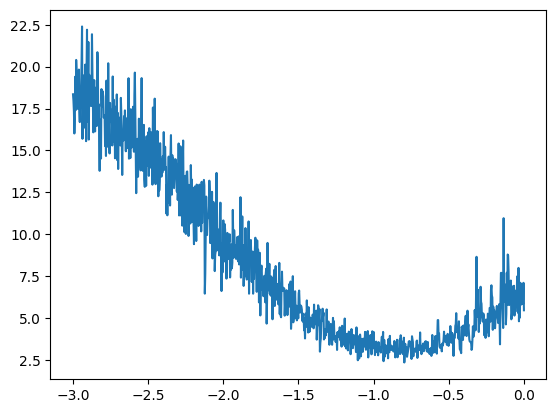

In [182]:
plt.plot(lri, lossi)

# Exponent -1.0 seems fairly good LR, so can go with -0.1 as learning rate

In [183]:
g = torch.Generator().manual_seed(2147483647) # for reproducibility
C = torch.randn((27, 2), generator=g)
W1 = torch.randn((6, 100), generator=g)
b1 = torch.randn(100, generator=g)
W2 = torch.randn((100, 27), generator=g)
b2 = torch.randn(27, generator=g)
parameters = [C, W1, b1, W2, b2]

sum(p.nelement() for p in parameters) # number of parameters in total

for p in parameters:
    p.requires_grad = True

In [184]:
lri = []
lossi = []

for i in range(10000):
    # minibatch construct
    ix = torch.randint(0, X.shape[0], (32,))
    
    # forward pass
    emb = C[X][ix] # 32, 3, 3
    h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # 32, 100
    logits = h @ W2 + b2 # 32, 27
    loss = F.cross_entropy(logits, Y[ix])
    # print(loss.item())
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    # update
    # lr = lrs[i]
    lr = 0.1
    for p in parameters:
        p.data += -lr * p.grad

    # # track status
    # lri.append(lre[i])
    # lossi.append(loss.item())

# Learning rate decay ( Change learning rate to lower when coming closer or if it is starts to plateau or is not changing enough)

In [186]:
emb = C[X]
h = torch.tanh(emb.view(-1, 6) @ W1 + b1) # 32, 100
logits = h @ W2 + b2 # 32, 27
loss = F.cross_entropy(logits, Y)
loss

tensor(2.5022, grad_fn=<NllLossBackward0>)

In [185]:
# training split, dev/validation split, test split
# 80%, 10%, 10%
# Training to train the parameteres, dev/validation to train the hyper parameters, test - evaluate the performance at the end

### Split the data set

In [187]:
# build the dataset
block_size = 3 # context length: how many characters do we take to predict the next one?

def build_dataset(words):  
  X, Y = [], []
  for w in words:

    #print(w)
    context = [0] * block_size
    for ch in w + '.':
      ix = stoi[ch]
      X.append(context)
      Y.append(ix)
      #print(''.join(itos[i] for i in context), '--->', itos[ix])
      context = context[1:] + [ix] # crop and append

  X = torch.tensor(X)
  Y = torch.tensor(Y)
  print(X.shape, Y.shape)
  return X, Y

import random
random.seed(42)
random.shuffle(words)
n1 = int(0.8*len(words))
n2 = int(0.9*len(words))

Xtr, Ytr = build_dataset(words[:n1])
Xdev, Ydev = build_dataset(words[n1:n2])
Xte, Yte = build_dataset(words[n2:])

torch.Size([182625, 3]) torch.Size([182625])
torch.Size([22655, 3]) torch.Size([22655])
torch.Size([22866, 3]) torch.Size([22866])


In [190]:
len(words), n1, n2, n2 - n1

(32033, 25626, 28829, 3203)

In [191]:
len(words) - n2 # So many examples for the training set

3204